**Importing Libraries**

In [ ]:
import pandas as pd
import numpy as np
import pickle
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
# Import other regression models
from sklearn.linear_model import Ridge
from sklearn.svm import LinearSVR
from sklearn.neural_network import MLPRegressor

**Importing Data**

In [ ]:
# Read the Walmart CSV file into a Pandas dataframe
df = pd.read_csv('/content/drive/MyDrive/Sales Forecasting ML/Walmart.csv')


**Showing Data**

In [ ]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05/02/2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12/02/2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19/02/2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26/02/2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05/03/2010,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,28/09/2012,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,05/10/2012,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,12/10/2012,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,19/10/2012,718125.53,0,56.47,3.969,192.330854,8.667


**Data Processing**

In [ ]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

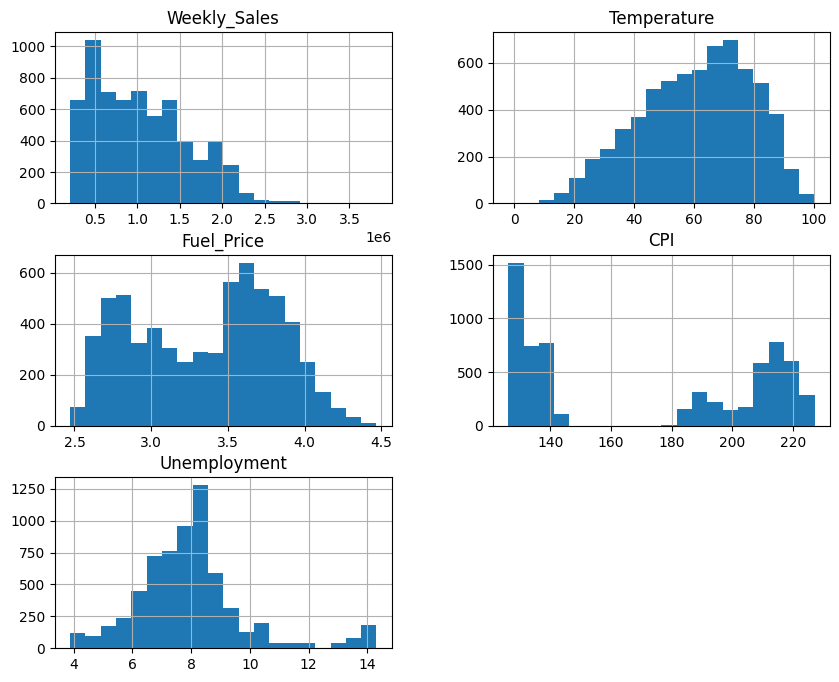

In [ ]:
# Individual Histogram for the numerical features
num_features = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
df[num_features].hist(bins=20, figsize=(10,8))
plt.show()

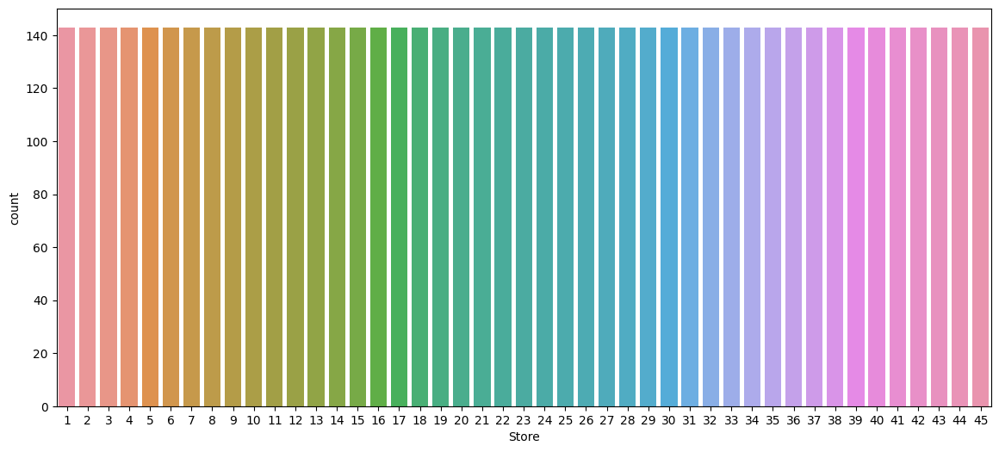

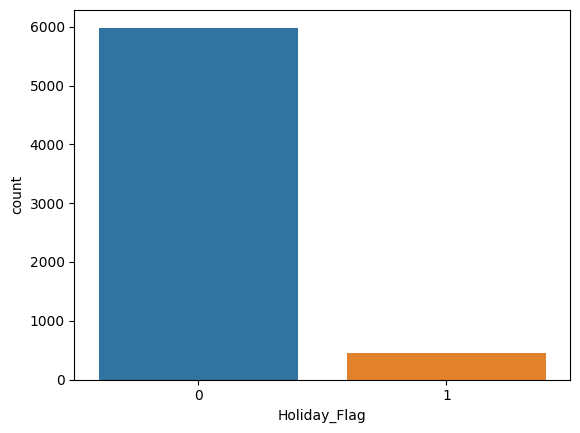

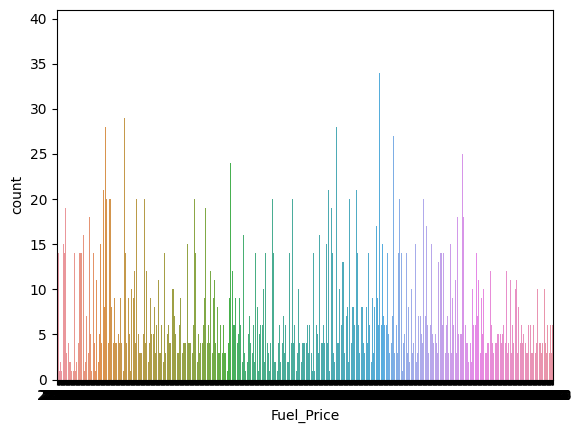

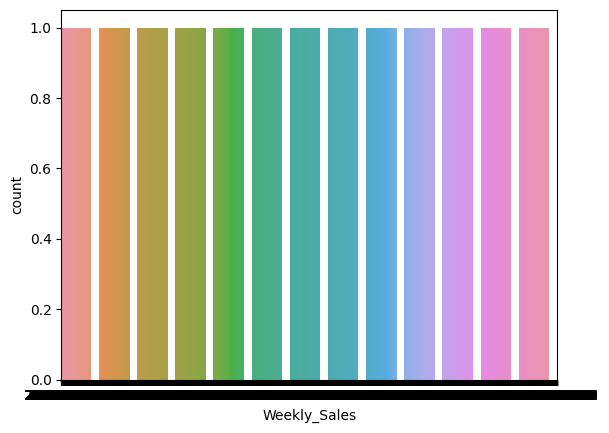

In [ ]:
# Individual Bar Chart for the categorical features
cat_features = ['Store', 'Holiday_Flag', 'Fuel_Price', 'Weekly_Sales']
plt.figure(figsize=(14, 6))
for feature in cat_features:
    sns.countplot(x=feature, data=df)
    plt.show()

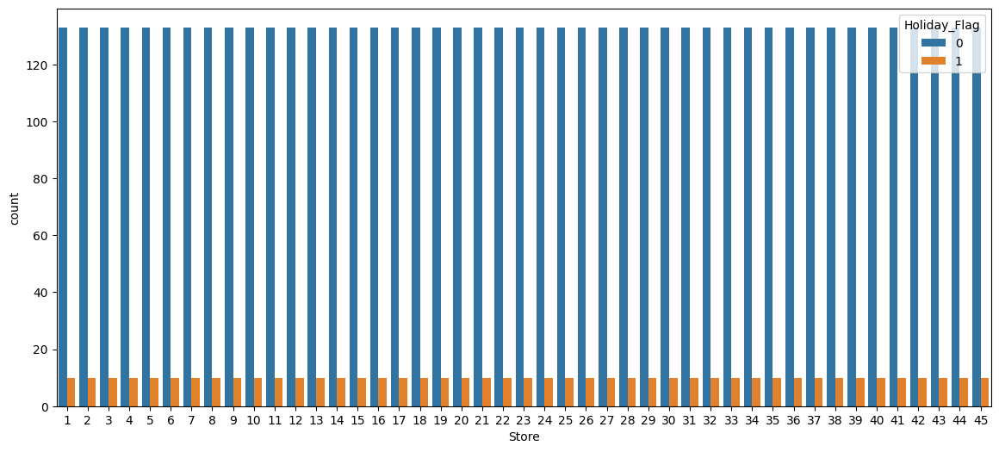

In [ ]:
# Bar plot for Categorical vs categorical
plt.figure(figsize=(14, 6))
sns.countplot(x='Store', hue='Holiday_Flag', data=df)
plt.show()

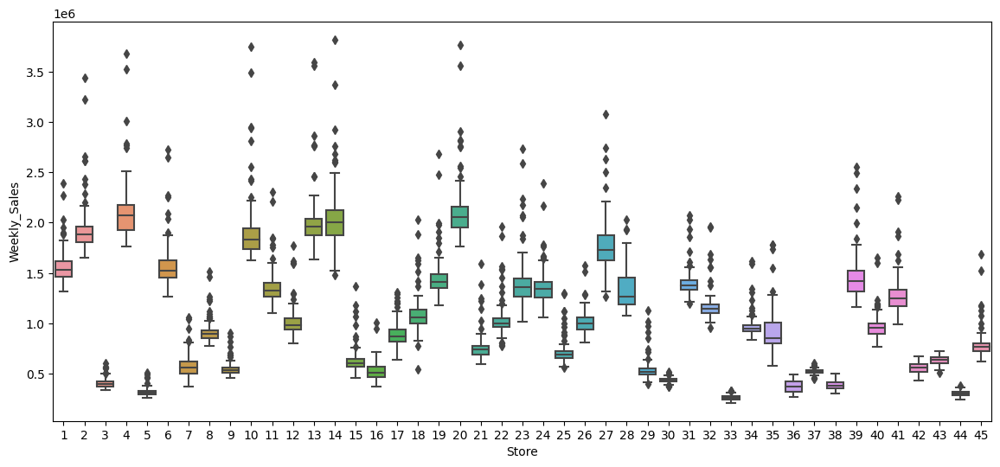

In [ ]:
# Categorical vs Numerical
plt.figure(figsize=(14, 6))
sns.boxplot(x='Store', y='Weekly_Sales', data=df)
plt.show()

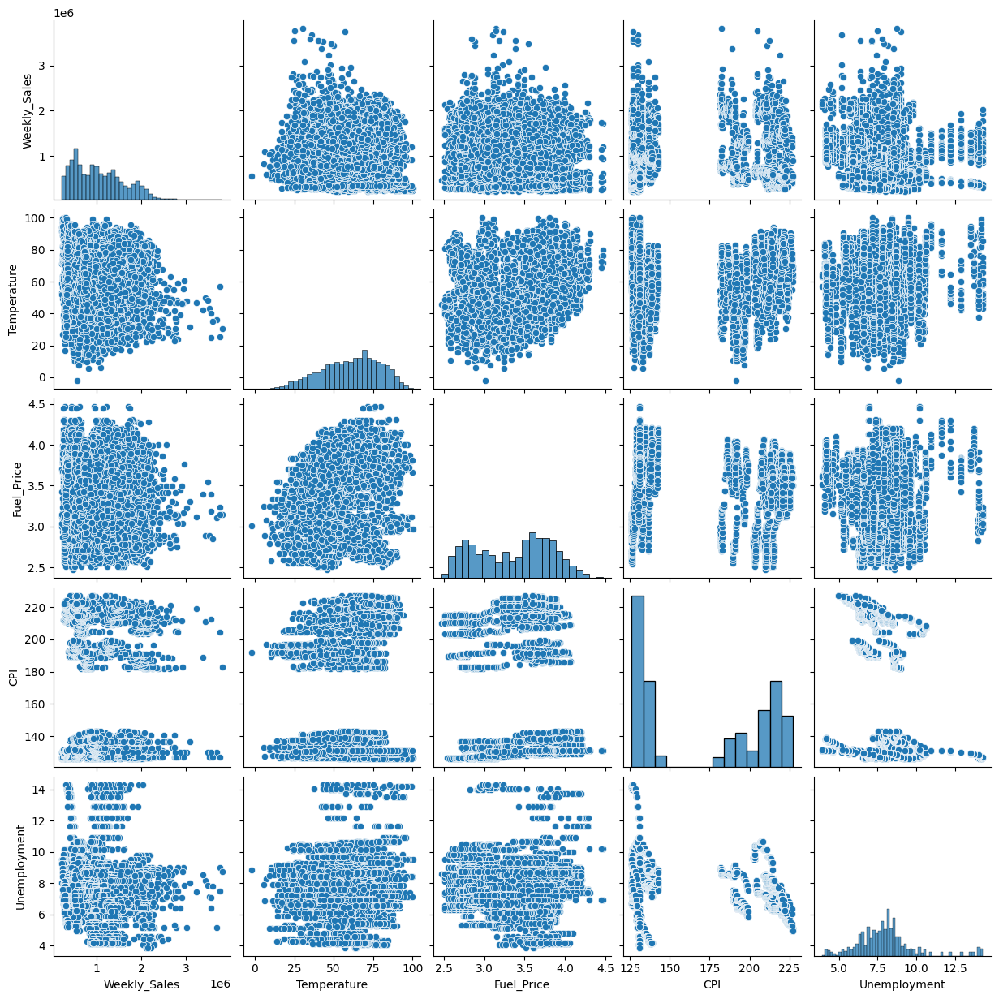

In [ ]:
# Numerical vs Numerical pairplot
sns.pairplot(df[num_features])
plt.show()

In [ ]:
# Missing data handling
print(df.isnull().sum())

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64


In [ ]:
# Stratified sampling on imbalanced class
#split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
#for train_index, test_index in split.split(df, df['Holiday_Flag']):
   # strat_train_set = df.loc[train_index]
   # strat_test_set = df.loc[test_index]

split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in split.split(df, df['Holiday_Flag']):
    strat_train_set = df.loc[train_index]
    strat_test_set = df.loc[test_index]

print("Stratified Train Set:")
print(strat_train_set.head())

print("\nStratified Test Set:")
strat_test_set.head()



Stratified Train Set:
      Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
1708     12  07/09/2012     955146.04             1        88.52       4.124   
1284      9  12/10/2012     558464.80             0        60.09       3.601   
6383     45  04/11/2011     833429.22             0        43.92       3.551   
4710     33  31/08/2012     237129.81             0        94.55       3.886   
3293     24  05/03/2010    1412387.37             0        36.73       2.919   

             CPI  Unemployment  
1708  130.932548        10.926  
1284  227.169392         4.954  
6383  187.970363         8.523  
4710  130.885355         7.147  
3293  131.735000         8.326  

Stratified Test Set:


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6322,45,03/09/2010,790144.70,0,78.37,2.715,182.604292,8.743
5256,37,02/03/2012,525559.17,0,64.54,3.630,219.534098,7.244
2680,19,17/02/2012,1424720.27,0,30.95,3.874,137.258310,7.943
5367,38,22/07/2011,365562.67,0,91.17,3.794,129.150774,13.503
3280,23,31/08/2012,1577468.78,0,68.34,3.884,138.377194,4.156


In [ ]:
# One hot encoding for categorical features
#cat_features = ['Store', 'Holiday_Flag']
#df_encoded = pd.get_dummies(df, columns=cat_features)


cat_features = ['Store', 'Holiday_Flag']
df_encoded = pd.get_dummies(df, columns=cat_features)

print("\nEncoded DataFrame:")
df_encoded.head()



Encoded DataFrame:


,Date,Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment,Store_1,Store_2,Store_3,Store_4,...,Store_38,Store_39,Store_40,Store_41,Store_42,Store_43,Store_44,Store_45,Holiday_Flag_0,Holiday_Flag_1
0,05/02/2010,1643690.90,42.31,2.572,211.096358,8.106,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
1,12/02/2010,1641957.44,38.51,2.548,211.242170,8.106,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,19/02/2010,1611968.17,39.93,2.514,211.289143,8.106,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,26/02/2010,1409727.59,46.63,2.561,211.319643,8.106,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,05/03/2010,1554806.68,46.50,2.625,211.350143,8.106,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
# Normalization / Standardization for numerical features
#num_features = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
#scaler = StandardScaler()
#df_scaled = pd.DataFrame(scaler.fit_transform(df_encoded[num_features]), columns=num_features)
#df_encoded[num_features] = df_scaled

num_features = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_encoded[num_features]), columns=num_features)
df_encoded[num_features] = df_scaled

print("\nScaled DataFrame:")
df_scaled.head()



Scaled DataFrame:


,Weekly_Sales,Temperature,Fuel_Price,CPI,Unemployment
0,1.057420,-0.995136,-1.713800,1.004175,0.056964
1,1.054348,-1.201170,-1.766089,1.007880,0.056964
2,1.001206,-1.124178,-1.840166,1.009074,0.056964
3,0.642828,-0.760907,-1.737766,1.009849,0.056964
4,0.899914,-0.767955,-1.598328,1.010624,0.056964


In [ ]:
# Balancing technique (SMOTE/ Oversampling / Undersampling)
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from imblearn.under_sampling import RandomUnderSampler

# Load the Walmart dataset
df = pd.read_csv('/content/drive/MyDrive/Sales Forecasting ML/Walmart.csv')

# Discretize the 'Weekly_Sales' variable into three categories
bins = [0, 10000, 50000, df['Weekly_Sales'].max()]
labels = ['low', 'medium', 'high']
df['Sales_Category'] = pd.cut(df['Weekly_Sales'], bins=bins, labels=labels)

# Encode the categorical features
cat_features = ['Store','Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
le = LabelEncoder()
for feature in cat_features:
    df[feature] = le.fit_transform(df[feature])

# Separate the features and target variable
X = df.drop(['Weekly_Sales'], axis=1)
y = df['Weekly_Sales']

# Undersample the majority class (low sales category)
undersample = RandomUnderSampler(sampling_strategy='majority')
X_resampled, y_resampled = undersample.fit_resample(X, y[df['Sales_Category'] != 'low'])

# Combine the undersampled data with the minority class (medium and high sales categories)
df_resampled = pd.concat([X_resampled, y_resampled], axis=1)
df_resampled = pd.concat([df_resampled, df[df['Sales_Category'] == 'medium']])
df_resampled = pd.concat([df_resampled, df[df['Sales_Category'] == 'high']])

# Print the class distribution of the resampled data
print(df_resampled['Sales_Category'].value_counts())

high      12870
low           0
medium        0
Name: Sales_Category, dtype: int64


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<ipython-input-10-4ae322da21d3>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


<Axes: >

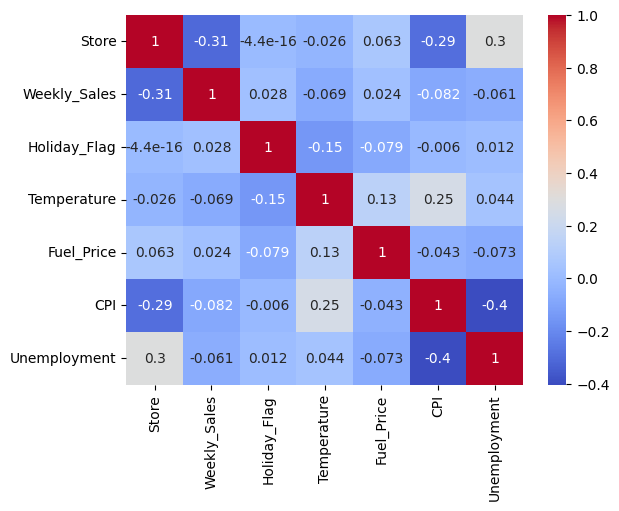

In [ ]:
# Plot the correlation matrix using seaborn
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

In [ ]:
correlation_holiday = df['Holiday_Flag'].corr(df['Weekly_Sales'])
correlation_cpi = df['CPI'].corr(df['Weekly_Sales'])

print("Correlation with holiday_flag:", correlation_holiday*100)
print("Correlation with CPI:", correlation_cpi*100)

Correlation with holiday_flag: 2.777432806119688
Correlation with CPI: -8.216541743147573


In [ ]:
import pandas as pd

# Load the Walmart dataset
df = pd.read_csv('/content/drive/MyDrive/Sales Forecasting ML/Walmart.csv')

# Handle missing values in the 'Weekly_Sales' column
df['Weekly_Sales'].fillna(0, inplace=True)  # Replace missing values with 0 or any appropriate value

# Convert the 'Weekly_Sales' column to numeric data type, handling non-numeric values
print("Before converting to numeric:")
print(df['Weekly_Sales'].head())  # Print the original 'Weekly_Sales' column before conversion

df['Weekly_Sales'] = pd.to_numeric(df['Weekly_Sales'], errors='coerce')  # Coerce non-numeric values to NaN

print("\nAfter converting to numeric:")
print(df['Weekly_Sales'].head())  # Print the 'Weekly_Sales' column after conversion

# Drop rows with missing or non-numeric 'Weekly_Sales'
print("\nNumber of rows before dropping missing or non-numeric 'Weekly_Sales':", len(df))
df.dropna(subset=['Weekly_Sales'], inplace=True)
print("Number of rows after dropping missing or non-numeric 'Weekly_Sales':", len(df))

# Discretize 'Weekly_Sales' into three categories (low, medium, and high)
bins = [-float('inf'), 10000, 50000, df['Weekly_Sales'].max()]
labels = ['low', 'medium', 'high']
df['Sales_Category'] = pd.cut(df['Weekly_Sales'], bins=bins, labels=labels)

print("\nFinal DataFrame:")
print(df.head())  # Print the DataFrame with the new 'Sales_Category' column


Before converting to numeric:
0    1643690.90
1    1641957.44
2    1611968.17
3    1409727.59
4    1554806.68
Name: Weekly_Sales, dtype: float64

After converting to numeric:
0    1643690.90
1    1641957.44
2    1611968.17
3    1409727.59
4    1554806.68
Name: Weekly_Sales, dtype: float64

Number of rows before dropping missing or non-numeric 'Weekly_Sales': 6435
Number of rows after dropping missing or non-numeric 'Weekly_Sales': 6435

Final DataFrame:
   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05/02/2010    1643690.90             0        42.31       2.572   
1      1  12/02/2010    1641957.44             1        38.51       2.548   
2      1  19/02/2010    1611968.17             0        39.93       2.514   
3      1  26/02/2010    1409727.59             0        46.63       2.561   
4      1  05/03/2010    1554806.68             0        46.50       2.625   

          CPI  Unemployment Sales_Category  
0  211.096358         8.106       

In [ ]:
# Create a binary weekend indicator
from datetime import datetime
df['Weekend_Indicator'] = df['Date'].apply(lambda x: 1 if datetime.strptime(x, '%d/%m/%Y').weekday() >= 5 else 0)

# Print the DataFrame with the new 'Weekend_Indicator' column
print(df.head())


   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05/02/2010    1643690.90             0        42.31       2.572   
1      1  12/02/2010    1641957.44             1        38.51       2.548   
2      1  19/02/2010    1611968.17             0        39.93       2.514   
3      1  26/02/2010    1409727.59             0        46.63       2.561   
4      1  05/03/2010    1554806.68             0        46.50       2.625   

          CPI  Unemployment Sales_Category  Weekend_Indicator  
0  211.096358         8.106           high                  0  
1  211.242170         8.106           high                  0  
2  211.289143         8.106           high                  0  
3  211.319643         8.106           high                  0  
4  211.350143         8.106           high                  0  


In [ ]:
#Calculate Holiday Week Weight
holiday_weeks = ['Super_Bowl', 'Labor_Day', 'Thanksgiving', 'Christmas']
df['Holiday_Week_Weight'] = df['Holiday_Flag'].apply(lambda x: 5 if x in holiday_weeks else 1)

# Print the DataFrame with the new 'Holiday_Week_Weight' column
print(df.head())

   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05/02/2010    1643690.90             0        42.31       2.572   
1      1  12/02/2010    1641957.44             1        38.51       2.548   
2      1  19/02/2010    1611968.17             0        39.93       2.514   
3      1  26/02/2010    1409727.59             0        46.63       2.561   
4      1  05/03/2010    1554806.68             0        46.50       2.625   

          CPI  Unemployment Sales_Category  Weekend_Indicator  \
0  211.096358         8.106           high                  0   
1  211.242170         8.106           high                  0   
2  211.289143         8.106           high                  0   
3  211.319643         8.106           high                  0   
4  211.350143         8.106           high                  0   

   Holiday_Week_Weight  
0                    1  
1                    1  
2                    1  
3                    1  
4                    

In [ ]:
#Create Lag Features for Weekly Sales (2-week lag)
df['Weekly_Sales_Lag_2'] = df['Weekly_Sales'].shift(2)

# Print the DataFrame after creating the lag feature
print("DataFrame with Lag Features for Weekly Sales (2-week lag):")
print(df.head())


DataFrame with Lag Features for Weekly Sales (2-week lag):
   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05/02/2010    1643690.90             0        42.31       2.572   
1      1  12/02/2010    1641957.44             1        38.51       2.548   
2      1  19/02/2010    1611968.17             0        39.93       2.514   
3      1  26/02/2010    1409727.59             0        46.63       2.561   
4      1  05/03/2010    1554806.68             0        46.50       2.625   

          CPI  Unemployment Sales_Category  Weekend_Indicator  \
0  211.096358         8.106           high                  0   
1  211.242170         8.106           high                  0   
2  211.289143         8.106           high                  0   
3  211.319643         8.106           high                  0   
4  211.350143         8.106           high                  0   

   Holiday_Week_Weight  Weekly_Sales_Lag_2  
0                    1                 NaN

In [ ]:
#Calculate Rolling Statistics for Weekly Sales (4-week rolling mean)
df['Rolling_Mean_4'] = df['Weekly_Sales'].rolling(window=4, min_periods=1).mean()

# Print the DataFrame after calculating the rolling mean
print("DataFrame with Rolling Statistics for Weekly Sales (4-week rolling mean):")
print(df.head())

DataFrame with Rolling Statistics for Weekly Sales (4-week rolling mean):
   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05/02/2010    1643690.90             0        42.31       2.572   
1      1  12/02/2010    1641957.44             1        38.51       2.548   
2      1  19/02/2010    1611968.17             0        39.93       2.514   
3      1  26/02/2010    1409727.59             0        46.63       2.561   
4      1  05/03/2010    1554806.68             0        46.50       2.625   

          CPI  Unemployment Sales_Category  Weekend_Indicator  \
0  211.096358         8.106           high                  0   
1  211.242170         8.106           high                  0   
2  211.289143         8.106           high                  0   
3  211.319643         8.106           high                  0   
4  211.350143         8.106           high                  0   

   Holiday_Week_Weight  Weekly_Sales_Lag_2  Rolling_Mean_4  
0          

In [ ]:
# Define the list of holiday weeks
holiday_weeks = ['Super_Bowl', 'Labor_Day', 'Thanksgiving', 'Christmas']

# Create a new column 'Holiday_Week' based on the 'Holiday_Flag' column
df['Holiday_Week'] = df['Holiday_Flag'].apply(lambda x: 1 if x in holiday_weeks else 0)

# Print the DataFrame after creating the 'Holiday_Week' feature
print("DataFrame with the 'Holiday_Week' feature:")
print(df.head())

DataFrame with the 'Holiday_Week' feature:
   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05/02/2010    1643690.90             0        42.31       2.572   
1      1  12/02/2010    1641957.44             1        38.51       2.548   
2      1  19/02/2010    1611968.17             0        39.93       2.514   
3      1  26/02/2010    1409727.59             0        46.63       2.561   
4      1  05/03/2010    1554806.68             0        46.50       2.625   

          CPI  Unemployment Sales_Category  Weekend_Indicator  \
0  211.096358         8.106           high                  0   
1  211.242170         8.106           high                  0   
2  211.289143         8.106           high                  0   
3  211.319643         8.106           high                  0   
4  211.350143         8.106           high                  0   

   Holiday_Week_Weight  Weekly_Sales_Lag_2  Rolling_Mean_4  Holiday_Week  
0                    1      

In [ ]:
# Print DataFrame after feature engineering
print(df.head())

   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05/02/2010    1643690.90             0        42.31       2.572   
1      1  12/02/2010    1641957.44             1        38.51       2.548   
2      1  19/02/2010    1611968.17             0        39.93       2.514   
3      1  26/02/2010    1409727.59             0        46.63       2.561   
4      1  05/03/2010    1554806.68             0        46.50       2.625   

          CPI  Unemployment Sales_Category  Weekend_Indicator  \
0  211.096358         8.106           high                  0   
1  211.242170         8.106           high                  0   
2  211.289143         8.106           high                  0   
3  211.319643         8.106           high                  0   
4  211.350143         8.106           high                  0   

   Holiday_Week_Weight  Weekly_Sales_Lag_2  Rolling_Mean_4  Holiday_Week  
0                    1                 NaN    1.643691e+06             

In [ ]:
# Print DataFrame columns
print(df.columns)

Index(['Store', 'Date', 'Weekly_Sales', 'Holiday_Flag', 'Temperature',
       'Fuel_Price', 'CPI', 'Unemployment', 'Sales_Category',
       'Weekend_Indicator', 'Holiday_Week_Weight', 'Weekly_Sales_Lag_2',
       'Rolling_Mean_4', 'Holiday_Week'],
      dtype='object')


In [ ]:
# Preprocessing
# Convert date column to datetime type
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')


In [ ]:
# Import libraries
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix, classification_report
import numpy as np
import warnings
import pandas as pd


In [ ]:
# Define your list of models and model names here
model_names = ['Random Forest', 'Linear Regression', 'SVR', 'Decision Tree', 'KNN', 'AdaBoost', 'XGBoost', 'Ridge', 'LinearSVR', 'MLPRegressor', 'Gradient Boosting', 'LightGBM']

# Split the data into features (X) and target (y)
X = df[['Store', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment',
        'Sales_Category', 'Weekend_Indicator', 'Holiday_Week_Weight',
        'Weekly_Sales_Lag_2', 'Rolling_Mean_4', 'Holiday_Week']]

y = df['Weekly_Sales']

In [ ]:
# Convert categorical columns to one-hot encoded features
categorical_columns = ['Store', 'Holiday_Flag', 'Sales_Category', 'Weekend_Indicator', 'Holiday_Week']
X_encoded = pd.get_dummies(X, columns=categorical_columns, drop_first=True)

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

In [ ]:
# Instantiate the imputer
imputer = SimpleImputer(strategy='mean')  # You can also use 'median' or 'most_frequent'

In [ ]:
# Perform imputation on the features
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

In [ ]:
# Define a list to store the mean squared errors (MSE)
mse_list = []

# Define a list to store the mean absolute errors (MAE)
mae_list = []

# Define a list to store the confusion matrices
confusion_mtx_list = []

# Define a list to store the classification reports
classification_rep_list = []

In [ ]:
# Define the models
models = [
    RandomForestRegressor(),
    LinearRegression(),
    SVR(),
    DecisionTreeRegressor(),
    KNeighborsRegressor(),
    AdaBoostRegressor(),
    XGBRegressor(),
    Ridge(),
    LinearSVR(),
    MLPRegressor(),
    GradientBoostingRegressor(),
    LGBMRegressor()
]

In [ ]:
# Iterate over the models
for model, model_name in zip(models, model_names):
    print('Training', model_name)

    # Model training
    model.fit(X_train_imputed, y_train)

    # Model evaluation
    y_pred = model.predict(X_test_imputed)
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    # Generate confusion matrix and classification report
    threshold = np.mean(y_train)
    y_pred_binary = np.where(y_pred > threshold, 1, 0)
    y_test_binary = np.where(y_test > threshold, 1, 0)
    confusion_mtx = confusion_matrix(y_test_binary, y_pred_binary)

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning)
        classification_rep = classification_report(y_test_binary, y_pred_binary, zero_division=0)
    # Append the MSE, MAE, confusion matrix, and classification report to the respective lists
    mse_list.append(mse)
    mae_list.append(mae)
    confusion_mtx_list.append(confusion_mtx)
    classification_rep_list.append(classification_rep)

    # Print the results for the current model
    print('Model:', model_name)
    print('Mean Squared Error:', mse)
    print('Mean Absolute Error:', mae)
    print('Confusion Matrix:')
    print(confusion_mtx)
    print('Classification Report:')
    print(classification_rep)
    print('--------------------------------------')

Training Random Forest
Model: Random Forest
Mean Squared Error: 14242558545.196363
Mean Absolute Error: 62690.171733954914
Confusion Matrix:
[[681  21]
 [ 14 571]]
Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       702
           1       0.96      0.98      0.97       585

    accuracy                           0.97      1287
   macro avg       0.97      0.97      0.97      1287
weighted avg       0.97      0.97      0.97      1287

--------------------------------------
Training Linear Regression
Model: Linear Regression
Mean Squared Error: 13703977554.270275
Mean Absolute Error: 61283.1386844083
Confusion Matrix:
[[680  22]
 [ 21 564]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       702
           1       0.96      0.96      0.96       585

    accuracy                           0.97      1287
   macro avg       0.97      0.97   

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model: LinearSVR
Mean Squared Error: 16190314250.401827
Mean Absolute Error: 66853.97596101723
Confusion Matrix:
[[669  33]
 [ 20 565]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       702
           1       0.94      0.97      0.96       585

    accuracy                           0.96      1287
   macro avg       0.96      0.96      0.96      1287
weighted avg       0.96      0.96      0.96      1287

--------------------------------------
Training MLPRegressor
Model: MLPRegressor
Mean Squared Error: 13191522571.325924
Mean Absolute Error: 60479.1466193429
Confusion Matrix:
[[675  27]
 [ 20 565]]
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       702
           1       0.95      0.97      0.96       585

    accuracy                           0.96      1287
   macro avg       0.96      0.96      0.96      1287
weighted avg       0

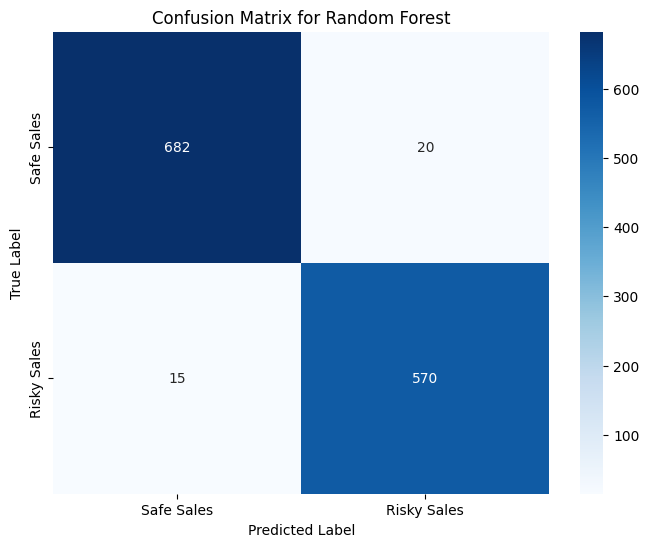

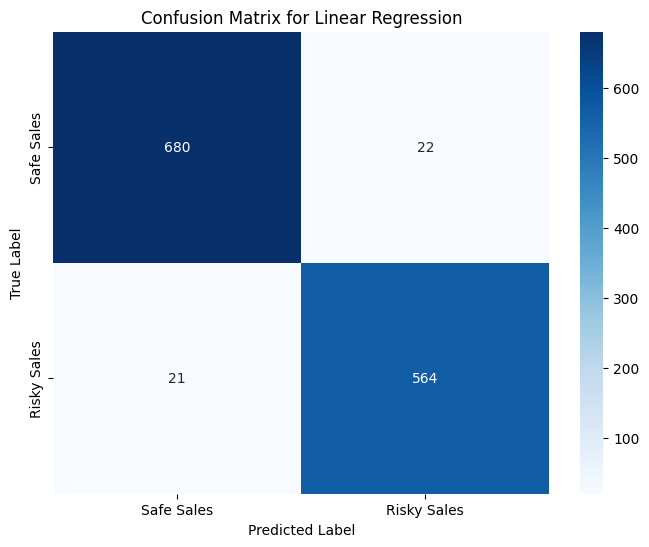

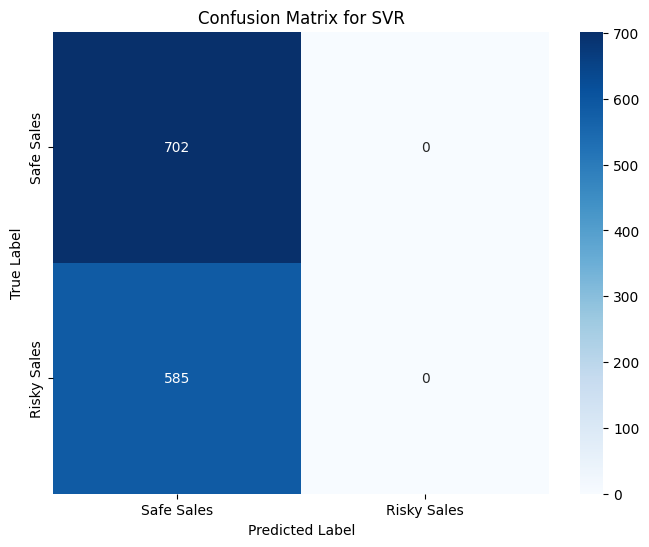

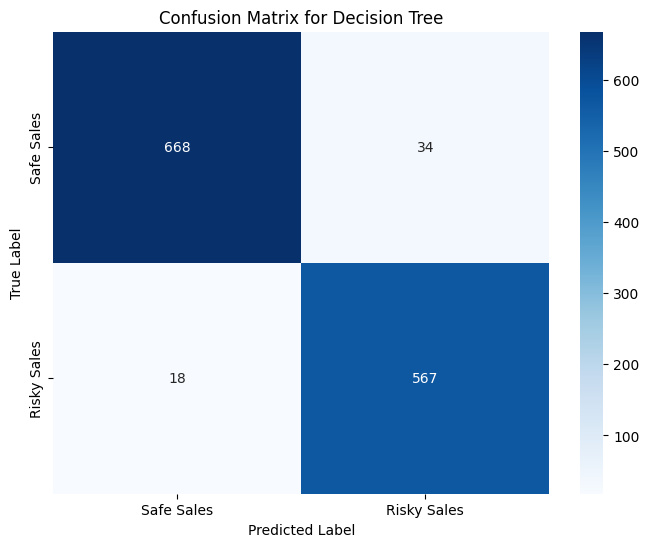

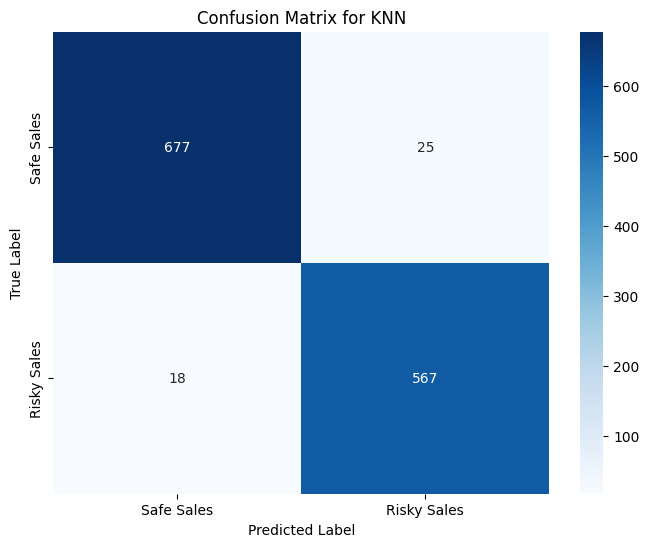

...

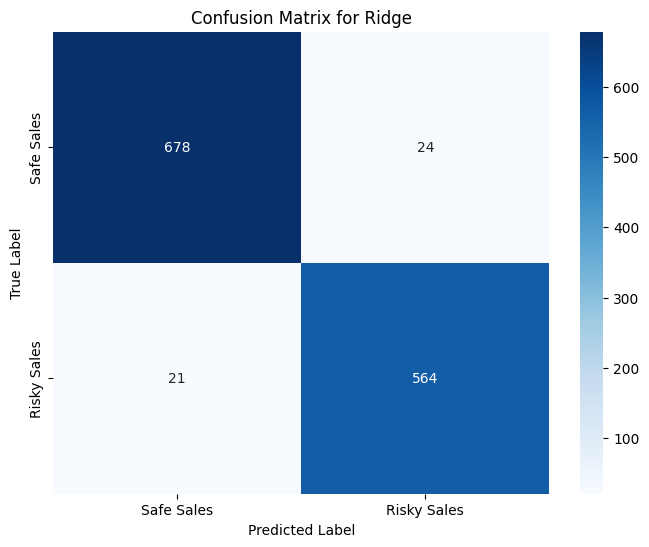

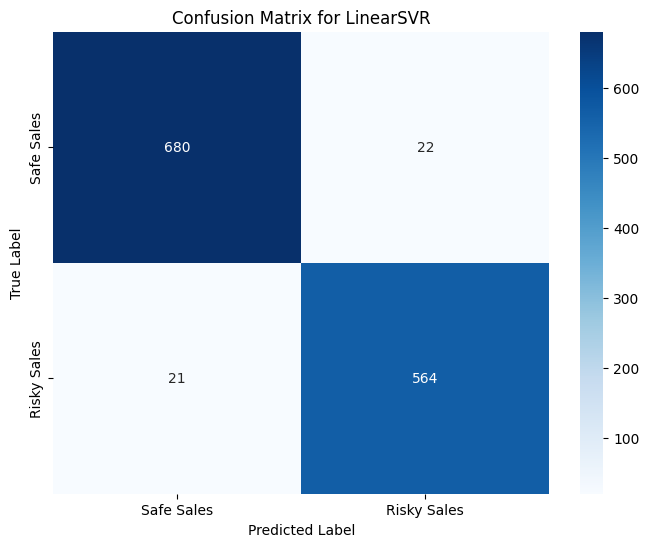

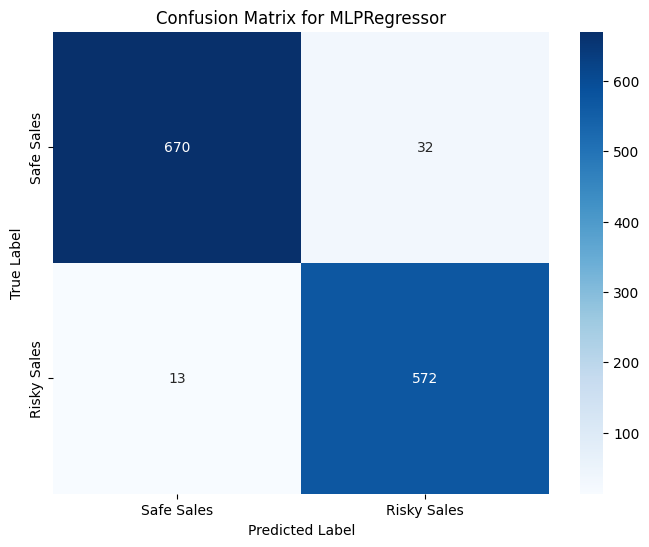

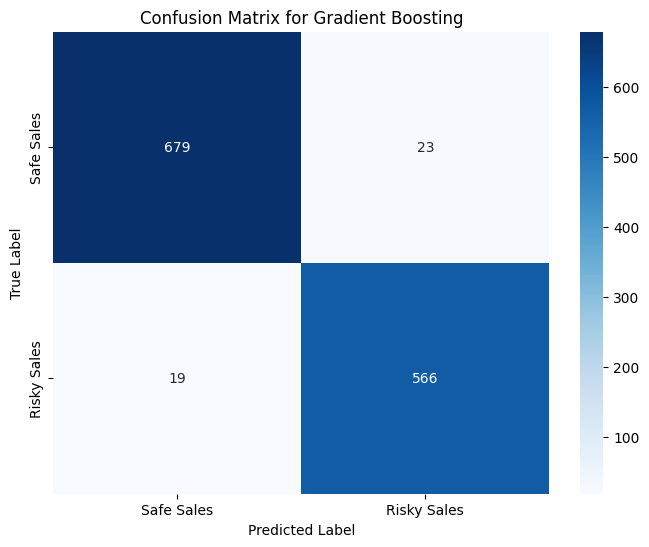

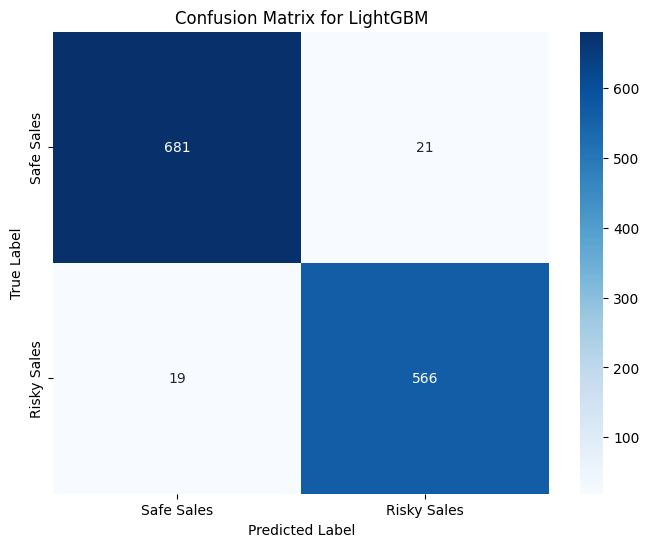

In [ ]:
# Plot the confusion matrices
for i, model_name in enumerate(model_names):
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_mtx_list[i], annot=True, fmt='d', cmap='Blues', xticklabels=['Safe Sales', 'Risky Sales'], yticklabels=['Safe Sales', 'Risky Sales'])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix for ' + model_name)

plt.show()

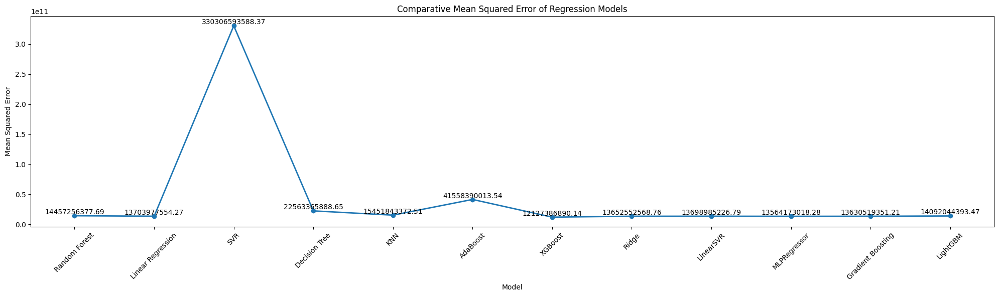

In [ ]:
import matplotlib.pyplot as plt

# Plot the comparative line plot
plt.figure(figsize=(20, 6))
plt.plot(model_names, mse_list, marker='o', linestyle='-', linewidth=2)

# Add accuracy values as labels on top of each data point
for i, mse in enumerate(mse_list):
    plt.text(i, mse, f"{mse:.2f}", ha='center', va='bottom')

# Customize the plot
plt.xlabel('Model')
plt.ylabel('Mean Squared Error')
plt.title('Comparative Mean Squared Error of Regression Models')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

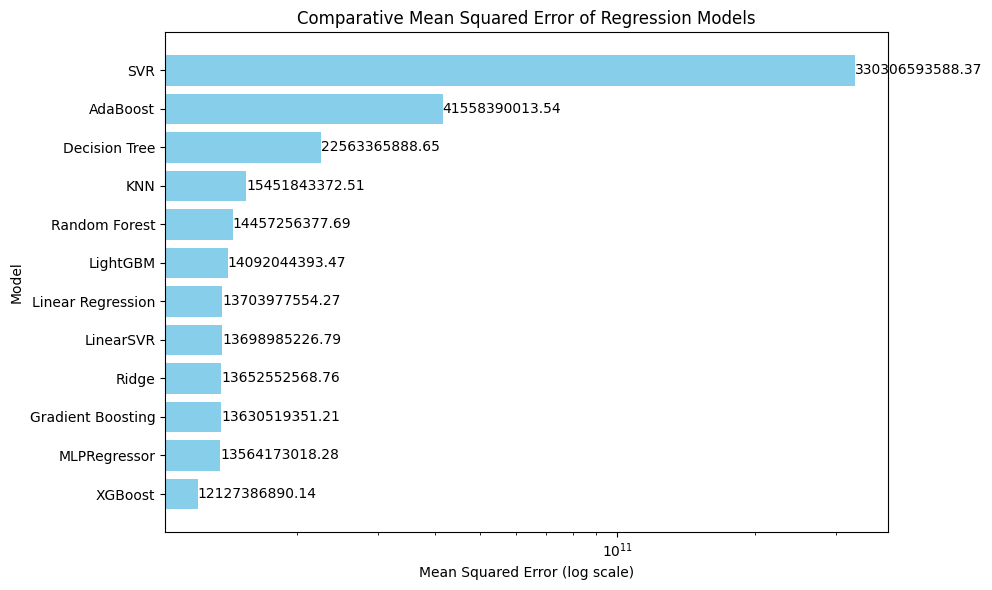

In [ ]:
import matplotlib.pyplot as plt

# Create a DataFrame to store the model names and MSE values
df = pd.DataFrame({'Model': model_names, 'MSE': mse_list})

# Sort the DataFrame by MSE values in ascending order
df.sort_values('MSE', ascending=True, inplace=True)

# Plot the comparative bar plot with logarithmic scale
plt.figure(figsize=(10, 6))
plt.barh(df['Model'], df['MSE'], color='skyblue')

# Add accuracy values as labels on the right side of each bar
for i, mse in enumerate(df['MSE']):
    plt.text(mse, i, f"{mse:.2f}", va='center')

# Customize the plot
plt.xlabel('Mean Squared Error (log scale)')
plt.ylabel('Model')
plt.title('Comparative Mean Squared Error of Regression Models')
plt.xscale('log')

# Show the plot
plt.tight_layout()
plt.show()


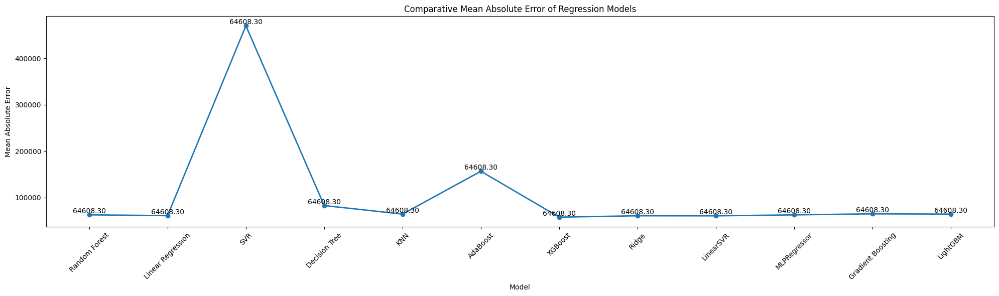

In [ ]:
import matplotlib.pyplot as plt

# Plot the comparative line plot
plt.figure(figsize=(20, 6))
plt.plot(model_names, mae_list, marker='o', linestyle='-', linewidth=2)

# Add accuracy values as labels on top of each data point
for i, mse in enumerate(mae_list):
    plt.text(i, mse, f"{mae:.2f}", ha='center', va='bottom')

# Customize the plot
plt.xlabel('Model')
plt.ylabel('Mean Absolute Error')
plt.title('Comparative Mean Absolute Error of Regression Models')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()

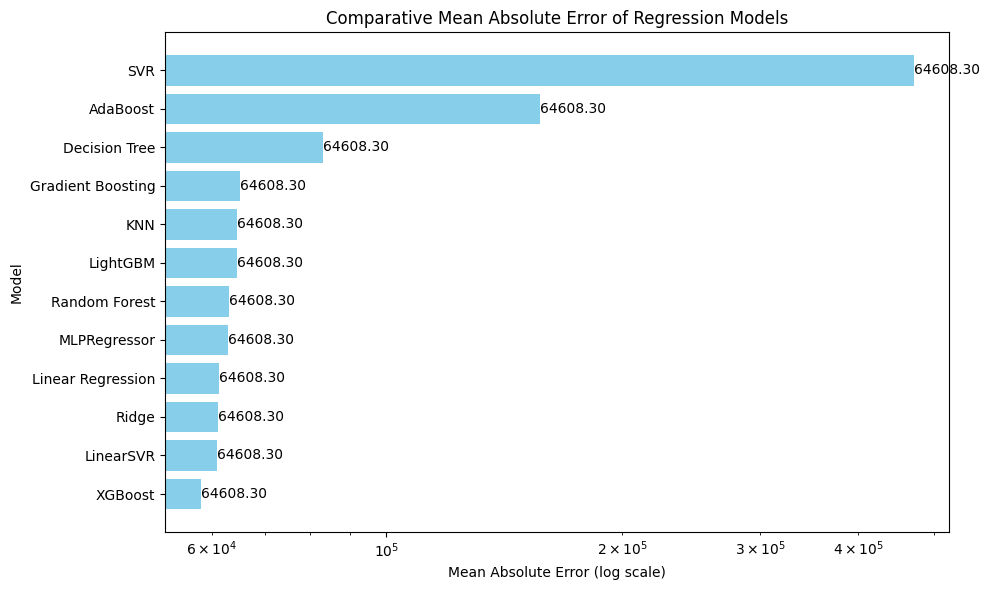

In [ ]:
import matplotlib.pyplot as plt

# Create a DataFrame to store the model names and MSE values
df = pd.DataFrame({'Model': model_names, 'MAE': mae_list})

# Sort the DataFrame by MSE values in ascending order
df.sort_values('MAE', ascending=True, inplace=True)

# Plot the comparative bar plot with logarithmic scale
plt.figure(figsize=(10, 6))
plt.barh(df['Model'], df['MAE'], color='skyblue')

# Add accuracy values as labels on the right side of each bar
for i, mse in enumerate(df['MAE']):
    plt.text(mse, i, f"{mae:.2f}", va='center')

# Customize the plot
plt.xlabel('Mean Absolute Error (log scale)')
plt.ylabel('Model')
plt.title('Comparative Mean Absolute Error of Regression Models')
plt.xscale('log')

# Show the plot
plt.tight_layout()
plt.show()

**XAI- SHAP, LIME**

In [ ]:
pip install shap lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=36eb744905630c87e8b25f1bf70bfd24beeb4debd1f9a40d790d8ec57e671d8c
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import shap
import lime
import lime.lime_tabular


Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


**RandomForestRegressor XAI**

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


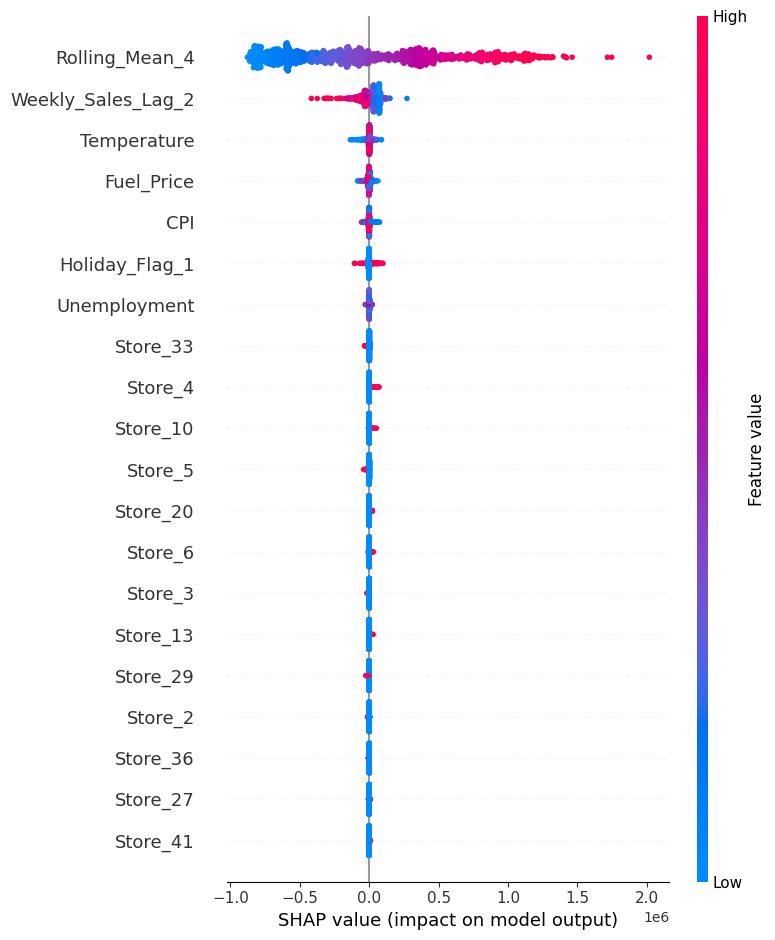

In [ ]:
# Create a SHAP explainer
explainer = shap.Explainer(model)  # 'model' is your trained RandomForestRegressor model

# Calculate SHAP values for a specific instance (e.g., the first instance in the test set)
shap_values = explainer.shap_values(X_test_imputed)  # Pass the entire test feature data

# Summary plot of feature importance
shap.summary_plot(shap_values, X_test_imputed, feature_names=X_encoded.columns)


In [ ]:
# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], model.predict)

# Plot the explanation
explanation.show_in_notebook()


**LinearRegression XAI - LIME**

In [ ]:
import lime
import lime.lime_tabular

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], models[1].predict)  # Assuming Linear Regression is at index 1

# Plot the explanation
explanation.show_in_notebook()



**LinearRegression XAI(LIME) - SVR**


In [ ]:
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], model.predict)  # Pass the SVR model's predict function

# Set a larger figure size (adjust the values as needed)
plt.figure(figsize=(30, 8))

# Plot the explanation
explanation.show_in_notebook()


<Figure size 3000x800 with 0 Axes>

**DecisionTreeRegressor XAI SHAP LIME**

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


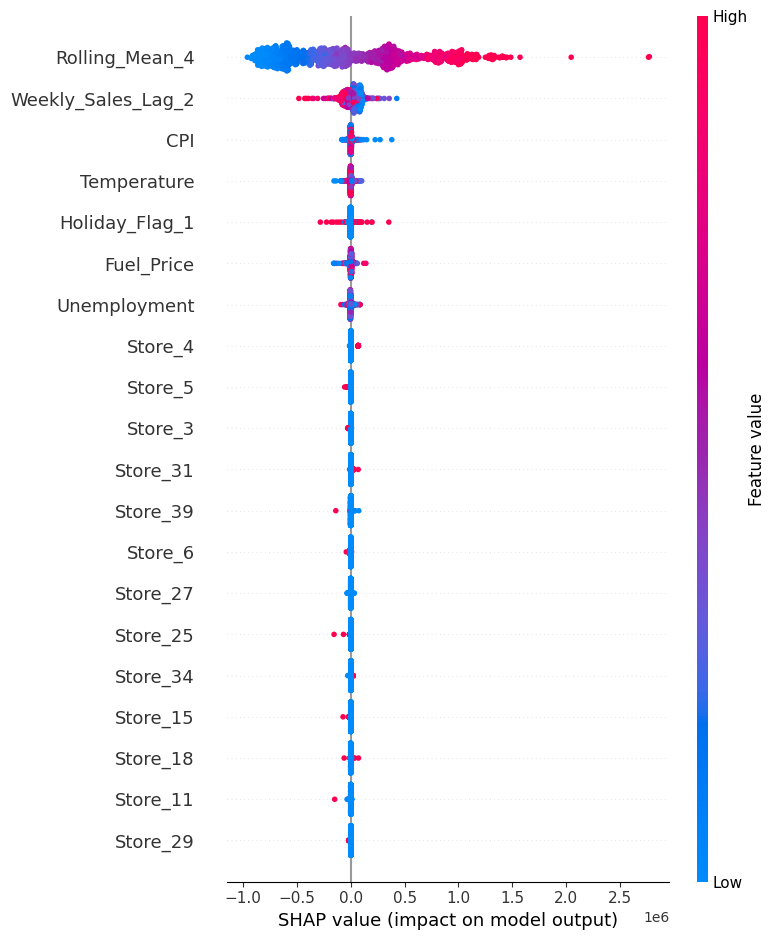

In [ ]:
import shap
from sklearn.tree import DecisionTreeRegressor

# Create and train a DecisionTreeRegressor model (replace this with your actual training code)
decision_tree_model = DecisionTreeRegressor()
decision_tree_model.fit(X_train_imputed, y_train)

# Create a SHAP explainer for DecisionTreeRegressor
explainer = shap.Explainer(decision_tree_model)

# Calculate SHAP values for a specific instance (e.g., the first instance in the test set)
shap_values = explainer.shap_values(X_test_imputed)  # Pass the entire test feature data

# Summary plot of feature importance
shap.summary_plot(shap_values, X_test_imputed, feature_names=X_encoded.columns)


In [ ]:
import lime
import lime.lime_tabular

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], decision_tree_model.predict)  # Pass the DecisionTreeRegressor model's predict function

# Plot the explanation
explanation.show_in_notebook()


**KNN XAI LIME**

In [ ]:
import lime
import lime.lime_tabular

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], knn_model.predict)

# Plot the explanation
explanation.show_in_notebook()



**MLPRegressor** **XAI LIME**

In [ ]:
import lime
import lime.lime_tabular

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], mlp_model.predict)

# Plot the explanation
explanation.show_in_notebook()



**GradientBoostingRegressor XAI SHAP LIME**

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


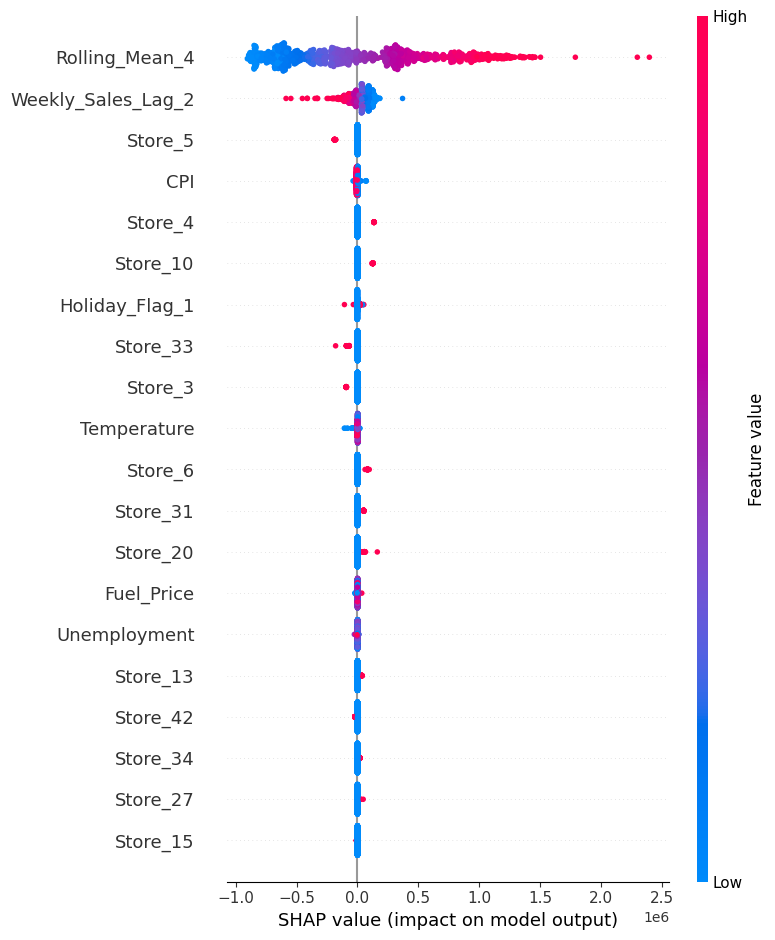

In [ ]:
import shap
from sklearn.ensemble import GradientBoostingRegressor

# Create and train a GradientBoostingRegressor model
gb_model = GradientBoostingRegressor()
gb_model.fit(X_train_imputed, y_train)

# Create a SHAP explainer for GradientBoostingRegressor
explainer = shap.Explainer(gb_model)

# Calculate SHAP values for a specific instance (e.g., the first instance in the test set)
shap_values = explainer.shap_values(X_test_imputed)  # Pass the entire test feature data

# Summary plot of feature importance
shap.summary_plot(shap_values, X_test_imputed, feature_names=X_encoded.columns)


In [ ]:
import lime
import lime.lime_tabular
from sklearn.ensemble import GradientBoostingRegressor

# Create and train a GradientBoostingRegressor model
gb_model = GradientBoostingRegressor()
gb_model.fit(X_train_imputed, y_train)

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], gb_model.predict)

# Plot the explanation
explanation.show_in_notebook()


**LGBMRegressor XAI SHAP LIME**

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1609
[LightGBM] [Info] Number of data points in the train set: 5148, number of used features: 51
[LightGBM] [Info] Start training from score 1044996.414472


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


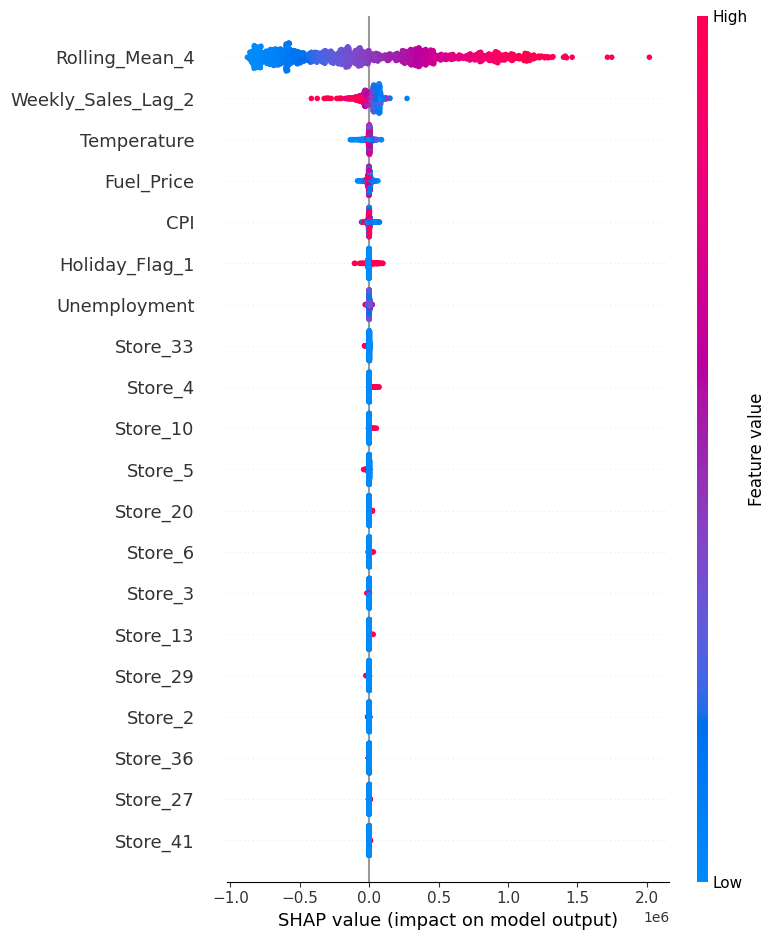

In [ ]:
import shap
from lightgbm import LGBMRegressor

# Create and train an LGBMRegressor model
lgbm_model = LGBMRegressor()
lgbm_model.fit(X_train_imputed, y_train)

# Create a SHAP explainer for LGBMRegressor
explainer = shap.Explainer(lgbm_model)

# Calculate SHAP values for a specific instance (e.g., the first instance in the test set)
shap_values = explainer.shap_values(X_test_imputed)  # Pass the entire test feature data

# Summary plot of feature importance
shap.summary_plot(shap_values, X_test_imputed, feature_names=X_encoded.columns)


In [ ]:
import lime
import lime.lime_tabular
from lightgbm import LGBMRegressor

# Create and train an LGBMRegressor model
lgbm_model = LGBMRegressor()
lgbm_model.fit(X_train_imputed, y_train)

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_imputed, mode="regression")

# Explain the prediction for a specific instance (e.g., the first instance in the test set)
explanation = explainer.explain_instance(X_test_imputed[0], lgbm_model.predict)

# Plot the explanation
explanation.show_in_notebook()


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001103 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1609
[LightGBM] [Info] Number of data points in the train set: 5148, number of used features: 51
[LightGBM] [Info] Start training from score 1044996.414472
